## Introduction 

#### This notebook is based on fake transaction data of a payment processing platform. The goal of this exercise is to:

#### 1) Customer segmentation
#### 2) Predict user churn

## Section Guide<a id='summary'></a>

### Part 1: Identify different kinds of customers
#### a) [Data Exploration](#data_exp)
#### b) [Customer Segmentation - Clustering using K-Means](#cluster)  

### Part 2: Churn Prediction 

#### a) [Define Churn](#define_churn)

#### b) [Customers who have already churned](#merchants_churned)

#### c) [Building Classification Model](#build_model)

In [1]:
import pandas as pd
import numpy as np
from numpy import arange
from numpy import argmax
import datetime
import seaborn as sns
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)
import matplotlib.pyplot as plt 
plt.rc("font", size=14)
import pylab as pl

In [2]:
#from kneed import KneeLocator
from sklearn.decomposition import PCA
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import ParameterGrid
from sklearn import metrics
from pylab import savefig
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import mutual_info_classif
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import roc_curve
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report

import plotly as py
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# Data Exploration<a id='data_exp'></a>

In [3]:
df_raw = pd.read_csv('transaction_data.csv')

In [4]:
# Note the "merchant" here means "customer"
df_raw.head()

,Unnamed: 0,merchant,time,amount_usd_in_cents
0,1,faa029c6b0,2034-06-17 23:34:14,6349
1,2,ed7a7d91aa,2034-12-27 00:40:38,3854
2,3,5608f200cf,2034-04-30 01:29:42,789
3,4,15b1a0d61e,2034-09-16 01:06:23,4452
4,5,4770051790,2034-07-22 16:21:42,20203


In [5]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1513719 entries, 0 to 1513718
Data columns (total 4 columns):
 #   Column               Non-Null Count    Dtype 
---  ------               --------------    ----- 
 0   Unnamed: 0           1513719 non-null  int64 
 1   merchant             1513719 non-null  object
 2   time                 1513719 non-null  object
 3   amount_usd_in_cents  1513719 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 46.2+ MB


In [6]:
df_raw.describe()

,Unnamed: 0,amount_usd_in_cents
count,1.513719e+06,1.513719e+06
mean,7.568600e+05,1.548466e+04
std,4.369732e+05,6.161886e+04
min,1.000000e+00,2.010000e+02
25%,3.784305e+05,3.215000e+03
50%,7.568600e+05,6.104000e+03
75%,1.135290e+06,1.260600e+04
max,1.513719e+06,2.592028e+07


In [7]:
df_raw['dt'] = pd.to_datetime(df_raw['time'])
df_raw['date'] = df_raw['dt'].dt.date
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1513719 entries, 0 to 1513718
Data columns (total 6 columns):
 #   Column               Non-Null Count    Dtype         
---  ------               --------------    -----         
 0   Unnamed: 0           1513719 non-null  int64         
 1   merchant             1513719 non-null  object        
 2   time                 1513719 non-null  object        
 3   amount_usd_in_cents  1513719 non-null  int64         
 4   dt                   1513719 non-null  datetime64[ns]
 5   date                 1513719 non-null  object        
dtypes: datetime64[ns](1), int64(2), object(3)
memory usage: 69.3+ MB


In [8]:
dt_max = datetime.datetime(2034,12,31,23,59,59) 
# Create a dataframe with merchant data
df_merchant = df_raw.groupby('merchant').agg(
                            min_amount = ('amount_usd_in_cents', min),
                            avg_amount = ('amount_usd_in_cents', 'mean'),
                            median_amount = ('amount_usd_in_cents', 'median'),
                            max_amount = ('amount_usd_in_cents', max),
                            count = ('amount_usd_in_cents', 'count'),
                            min_dt = ('dt', min),
                            max_dt = ('dt', max),
                            active_date_range = ('dt', lambda x: (max(x)-min(x)).days),
                            age = ('dt', lambda x: (dt_max - min(x)).days)
                        )
# Set accounts with age = 0 to 1, to avoid division by 0
df_merchant.loc[df_merchant['active_date_range']==0,'active_date_range'] = 1
df_merchant.loc[df_merchant['age']==0,'age'] = 1
# Get daily transaction count
df_merchant['count_daily'] = df_merchant['count'] / df_merchant['age']
df_merchant['days_inactive'] = [(dt_max - t).days for t in df_merchant['max_dt']]
df_merchant['days_active'] = df_raw.groupby('merchant')['date'].nunique()
df_merchant.head()

,min_amount,avg_amount,median_amount,max_amount,count,min_dt,max_dt,active_date_range,age,count_daily,days_inactive,days_active
merchant,,,,,,,,,,,,
0002b63b92,3379,3379.000000,3379.0,3379,1,2033-05-16 20:07:57,2033-05-16 20:07:57,1,594,0.001684,594,1
0002d07bba,2057,22319.500000,21689.5,43842,4,2034-10-11 17:02:26,2034-12-15 09:56:19,64,81,0.049383,16,4
00057d4302,605,1054.321429,752.0,4073,28,2033-05-30 01:30:52,2033-08-04 04:26:40,66,580,0.048276,514,2
000bcff341,7826,7826.000000,7826.0,7826,1,2033-08-09 20:18:36,2033-08-09 20:18:36,1,509,0.001965,509,1
000ddbf0ca,10299,10299.000000,10299.0,10299,1,2033-06-02 13:25:12,2033-06-02 13:25:12,1,577,0.001733,577,1


In [9]:
df_merchant.describe()

,min_amount,avg_amount,median_amount,max_amount,count,active_date_range,age,count_daily,days_inactive,days_active
count,1.435100e+04,1.435100e+04,1.435100e+04,1.435100e+04,14351.000000,14351.000000,14351.000000,14351.000000,14351.000000,14351.000000
mean,1.727865e+04,3.810458e+04,3.152152e+04,1.251715e+05,105.478294,199.626646,336.881402,0.319387,136.961605,33.087868
std,9.639884e+04,1.415186e+05,1.134405e+05,4.287935e+05,527.717966,203.704240,205.577564,1.420786,174.498650,71.559915
min,2.010000e+02,2.010000e+02,2.010000e+02,2.010000e+02,1.000000,1.000000,1.000000,0.001379,0.000000,1.000000
25%,1.233000e+03,5.738182e+03,4.514500e+03,1.214350e+04,3.000000,17.000000,158.000000,0.015152,10.000000,3.000000
50%,2.823000e+03,1.096500e+04,8.270500e+03,3.047300e+04,11.000000,127.000000,325.000000,0.047985,51.000000,7.000000
75%,7.723500e+03,2.732122e+04,2.013750e+04,9.305150e+04,45.000000,348.000000,509.000000,0.169910,213.000000,26.000000
max,7.911488e+06,8.887465e+06,8.570644e+06,2.592028e+07,25512.000000,728.000000,729.000000,70.042254,728.000000,724.000000


In [10]:
df_m = df_merchant[['median_amount', 'count', 'age', 'count_daily','days_active','active_date_range']]

In [11]:
fig = px.scatter_matrix(df_m,width=1000, height=800)
fig.show()

In [12]:
px.scatter_matrix(df_merchant[['median_amount', 'count', 'age', 'count_daily','days_active']]
                  ,width=1000, height=800)

In [13]:
# Some merchants have large number of transactions - could be valid if the average daily count is reasonable
df_merchant.sort_values(by='count', ascending=False)

,min_amount,avg_amount,median_amount,max_amount,count,min_dt,max_dt,active_date_range,age,count_daily,days_inactive,days_active
merchant,,,,,,,,,,,,
5608f200cf,382,8.196759e+02,820.0,902,25512,2033-03-29 21:21:57,2034-12-31 04:44:54,641,642,39.738318,0,632
53b3fbeae2,209,4.987169e+03,3993.0,70436,12178,2033-11-29 20:40:04,2034-12-31 06:13:56,396,397,30.675063,0,397
1ddaea9838,378,3.441583e+03,2275.0,74485,12042,2033-01-03 15:16:32,2034-12-31 07:23:54,726,727,16.563961,0,721
89e2d29885,201,1.508438e+03,566.0,331737,11969,2033-01-25 21:56:56,2034-12-31 02:05:34,704,705,16.977305,0,640
654930c922,1178,1.346608e+04,9223.5,2206268,11222,2033-01-11 19:03:11,2034-12-30 23:38:40,718,719,15.607789,1,123
...,...,...,...,...,...,...,...,...,...,...,...,...
9847b12953,10815,1.081500e+04,10815.0,10815,1,2033-09-21 18:44:53,2033-09-21 18:44:53,1,466,0.002146,466,1
985bf67891,1933,1.933000e+03,1933.0,1933,1,2034-12-19 22:44:57,2034-12-19 22:44:57,1,12,0.083333,12,1
9865dca5a3,1312820,1.312820e+06,1312820.0,1312820,1,2034-11-30 19:36:22,2034-11-30 19:36:22,1,31,0.032258,31,1


/Users/Xuru/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/Xuru/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/Xuru/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Use

Text(0.5, 1.0, 'active_date_range')

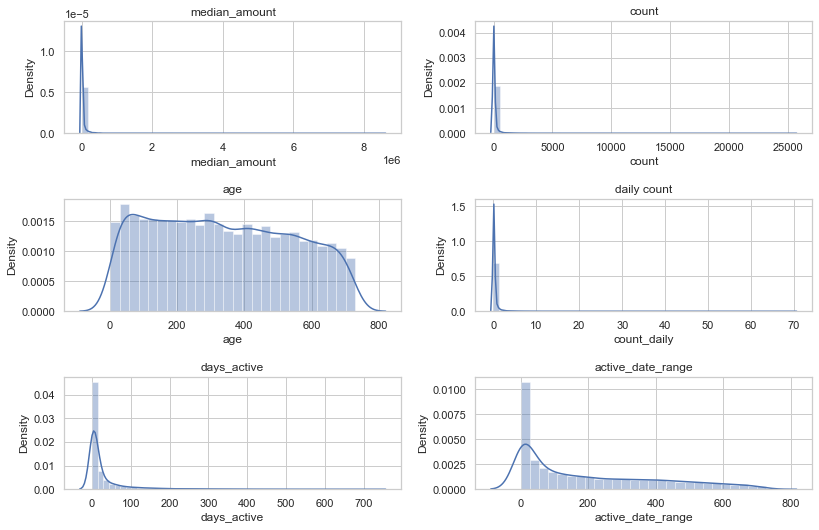

In [15]:
fig, ax = plt.subplots(3,2, figsize=(12,8))
fig.tight_layout(pad=3.0)

sns.distplot(df_m['median_amount'], ax=ax[0,0])
ax[0,0].set_title("median_amount")

sns.distplot(df_m['count'], ax=ax[0,1])
ax[0,1].set_title("count")

sns.distplot(df_m['age'], ax=ax[1,0])
ax[1,0].set_title("age")

sns.distplot(df_m['count_daily'], ax=ax[1,1])
ax[1,1].set_title("daily count")

sns.distplot(df_m['days_active'], ax=ax[2,0])
ax[2,0].set_title("days_active")

sns.distplot(df_m['active_date_range'], ax=ax[2,1])
ax[2,1].set_title("active_date_range")

In [16]:
df_m['log_median_amount'] = np.log(df_m['median_amount'])
df_m['log_count'] = np.log(df_m['count'])
df_m['log_daily_count'] = np.log(df_m['count_daily'])
df_m['log_days_active'] = np.log(df_m['days_active'])
df_m['log_active_date_range'] = np.log(df_m['active_date_range'])

<ipython-input-16-114961f817fe>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-16-114961f817fe>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-16-114961f817fe>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-16-114961f

In [17]:
df_m.describe()

,median_amount,count,age,count_daily,days_active,active_date_range,log_median_amount,log_count,log_daily_count,log_days_active,log_active_date_range
count,1.435100e+04,14351.000000,14351.000000,14351.000000,14351.000000,14351.000000,14351.000000,14351.000000,14351.000000,14351.000000,14351.000000
mean,3.152152e+04,105.478294,336.881402,0.319387,33.087868,199.626646,9.255165,2.593831,-2.905130,2.200161,4.073199
std,1.134405e+05,527.717966,205.577564,1.420786,71.559915,203.704240,1.290275,1.843844,1.763827,1.570469,2.180734
min,2.010000e+02,1.000000,1.000000,0.001379,1.000000,1.000000,5.303305,0.000000,-6.586172,0.000000,0.000000
25%,4.514500e+03,3.000000,158.000000,0.015152,3.000000,17.000000,8.415050,1.098612,-4.189655,1.098612,2.833213
50%,8.270500e+03,11.000000,325.000000,0.047985,7.000000,127.000000,9.020450,2.397895,-3.036874,1.945910,4.844187
75%,2.013750e+04,45.000000,509.000000,0.169910,26.000000,348.000000,9.910339,3.806662,-1.772488,3.258097,5.852202
max,8.570644e+06,25512.000000,729.000000,70.042254,724.000000,728.000000,15.963853,10.146904,4.249099,6.584791,6.590301


/Users/Xuru/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/Xuru/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Users/Xuru/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/Use

Text(0.5, 1.0, 'log_active_date_range')

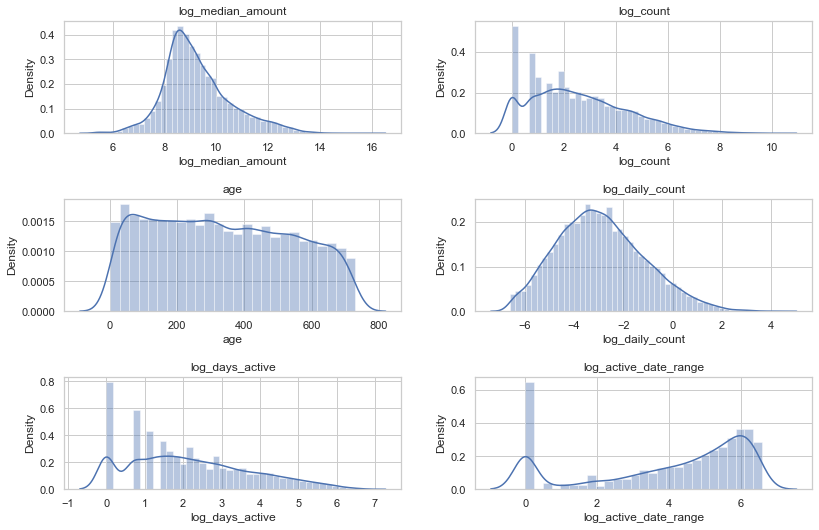

In [18]:
fig, ax = plt.subplots(3,2, figsize=(12,8))
fig.tight_layout(pad=3.0)

sns.distplot(df_m['log_median_amount'], ax=ax[0,0])
ax[0,0].set_title("log_median_amount")

sns.distplot(df_m['log_count'], ax=ax[0,1])
ax[0,1].set_title("log_count")

sns.distplot(df_m['age'], ax=ax[1,0])
ax[1,0].set_title("age")

sns.distplot(df_m['log_daily_count'], ax=ax[1,1])
ax[1,1].set_title("log_daily_count")

sns.distplot(df_m['log_days_active'], ax=ax[2,0])
ax[2,0].set_title("log_days_active")

sns.distplot(df_m['log_active_date_range'], ax=ax[2,1])
ax[2,1].set_title("log_active_date_range")

In [19]:
# Visualize the data using 4 features
fig = px.scatter_3d(df_m, x="log_median_amount", y="log_count", z="age", color="log_days_active")
fig.update_layout(title="4 Features Representation")
fig.show()

# Customer Segmentation - Clustering using K-Means<a id='cluster'></a>

### Determine the best number of clusters (K)<a id='determine_k'></a> 

In [32]:
# Select features 
col_names = ['log_median_amount','log_count','age','log_daily_count','log_days_active']
X = df_m[col_names]

# Standardize features
X = StandardScaler().fit_transform(X)

# Use Elbow method to choose the best K
inertia = []

for i in range(1,11):
    kmeans = KMeans(
        n_clusters=i, init="k-means++",
        n_init=10,
        tol=1e-04, random_state=42
    )
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)
    
fig = go.Figure(data=go.Scatter(x=np.arange(1,11),y=inertia))
fig.update_layout(title="Inertia vs Cluster Number",xaxis=dict(range=[0,11],title="Cluster Number"),
                  yaxis={'title':'Inertia'})    

Looks like 3 or 4 clusters would be good choices. Use 4 clusters first and see if the cluster characteristics can be well seperated.

### Fit K-Means<a id='fit_kmean'></a>

In [29]:
def fit_kmeans_and_plot(df_m, col_names, K):

    # Select features 
    X = df_m[col_names]

    # Standardize features
    X = StandardScaler().fit_transform(X)

    # Fit KMeans
    kmeans = KMeans(
            n_clusters=K, init="k-means++",
            n_init=10,
            tol=1e-04, random_state=42
            )
    kmeans.fit(X)

    # Visualize cluster attributions
    clusters = pd.DataFrame(X, columns=col_names)
    clusters = pd.concat([df_m.merchant, clusters], axis=1)
    clusters['label'] = kmeans.labels_

    polar = clusters.groupby("label").mean().reset_index()
    polar = pd.melt(polar,id_vars=["label"])

    fig = px.line_polar(polar, r="value", theta="variable", color="label", line_close=True,height=600,width=700)
    fig.show()

    pie=clusters.groupby('label').size().reset_index()
    pie.columns=['label','value']
    px.pie(pie,values='value',names='label',color='label').show()

    # Show average feature value for each cluster
    df = df_m.copy()
    df['label'] = kmeans.labels_
    print(df.groupby('label')[['median_amount','count','age','active_date_range','count_daily','days_active']].mean())
    
    return clusters

In [34]:
df_m.reset_index(inplace=True)

In [99]:
df_m['days_inactive'] = df_m['age'] - df_m['active_date_range']
df_m

,median_amount,count,age,count_daily,days_active,active_date_range,log_median_amount,log_count,log_daily_count,log_days_active,log_active_date_range,label,days_inactive
merchant,,,,,,,,,,,,,
0002b63b92,3379.0,1,594,0.001684,1,1,8.125335,0.000000,-6.386879,0.000000,0.000000,1,593
0002d07bba,21689.5,4,81,0.049383,4,64,9.984584,1.386294,-3.008155,1.386294,4.158883,3,17
00057d4302,752.0,28,580,0.048276,2,66,6.622736,3.332205,-3.030824,0.693147,4.189655,1,514
000bcff341,7826.0,1,509,0.001965,1,1,8.965207,0.000000,-6.232448,0.000000,0.000000,1,508
000ddbf0ca,10299.0,1,577,0.001733,1,1,9.239802,0.000000,-6.357842,0.000000,0.000000,1,576
...,...,...,...,...,...,...,...,...,...,...,...,...,...
ffd3e45675,14195.0,5,726,0.006887,5,22,9.560645,1.609438,-4.978112,1.609438,3.091042,1,704
ffe1f6b51a,4565.0,53,575,0.092174,47,260,8.426174,3.970292,-2.384078,3.850148,5.560682,2,315
ffe26b900d,12336.0,81,374,0.216578,66,334,9.420277,4.394449,-1.529807,4.189655,5.811141,2,40


/Users/Xuru/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='days_inactive', ylabel='Density'>

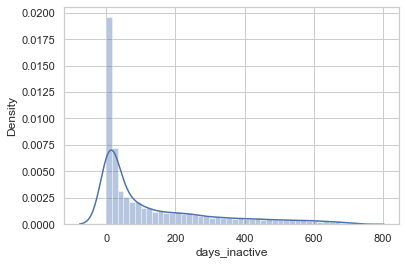

In [100]:
sns.distplot(df_m['days_inactive'])

In [36]:
col_names = ['log_median_amount','log_count','age','log_daily_count','log_days_active']
clusters_5_features = fit_kmeans_and_plot(df_m, col_names, 4)

       median_amount       count         age  active_date_range  count_daily  \
label                                                                          
0      122115.999226    4.413700  295.951625         102.709365     0.024757   
1       10117.337203   14.296094  521.682054         256.432669     0.027976   
2       15992.750640  361.265097  405.950614         356.505118     1.005534   
3        8880.017627    9.088137  136.615769          63.701525     0.116128   

       days_active  
label               
0         4.003870  
1         9.653647  
2       103.490276  
3         5.887566  


Try a few other clustering choices (with less features, with PCA)

In [37]:
# Try clustering with 4 features
col_names = ['log_median_amount','age','log_count','log_days_active']
clusters_4_features = fit_kmeans_and_plot(df_m, col_names, 4)

       median_amount       count         age  active_date_range  count_daily  \
label                                                                          
0      135965.136818    6.951270  290.783007         125.499375     0.044273   
1       14301.824876  366.112739  420.089982         372.229401     0.967642   
2        9340.760912   15.220481  522.344992         245.337997     0.030601   
3        8313.913354    9.440369  145.739073          57.906216     0.146839   

       days_active  
label               
0         5.737609  
1       105.738164  
2         8.974538  
3         5.437294  


In [ ]:
col_names = ['log_median_amount','log_count','age','log_daily_count','log_days_active']
clusters_5_features = fit_kmeans_and_plot(df_m, col_names, 4)

The above results with 4 features seems consistent in terms of the story we can tell from the 5 feature model

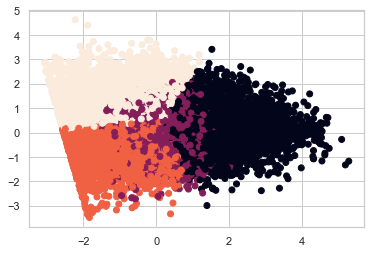

In [38]:
scaled_features = StandardScaler().fit_transform(df_m[col_names])
pca = PCA(n_components=2).fit(scaled_features)
pca_2d = pca.transform(scaled_features)
kmeans = KMeans(n_clusters=4, random_state=111)
kmeans.fit(scaled_features)
plt.figure('K-means with 4 clusters')
plt.scatter(pca_2d[:, 0], pca_2d[:, 1], c=kmeans.labels_)
plt.show()

In [30]:
#df_m.drop(['label_x','label_y'],axis=1, inplace=True)

In [39]:
df_m = df_m.merge(clusters_5_features[['merchant','label']], on='merchant')
df_m.set_index('merchant', inplace=True)
df_m.head()

,median_amount,count,age,count_daily,days_active,active_date_range,log_median_amount,log_count,log_daily_count,log_days_active,log_active_date_range,label
merchant,,,,,,,,,,,,
0002b63b92,3379.0,1,594,0.001684,1,1,8.125335,0.000000,-6.386879,0.000000,0.000000,1
0002d07bba,21689.5,4,81,0.049383,4,64,9.984584,1.386294,-3.008155,1.386294,4.158883,3
00057d4302,752.0,28,580,0.048276,2,66,6.622736,3.332205,-3.030824,0.693147,4.189655,1
000bcff341,7826.0,1,509,0.001965,1,1,8.965207,0.000000,-6.232448,0.000000,0.000000,1
000ddbf0ca,10299.0,1,577,0.001733,1,1,9.239802,0.000000,-6.357842,0.000000,0.000000,1


In [40]:
df_merchant = df_merchant.merge(df_m['label'], left_index=True, right_index=True, how='left')
df_merchant.rename(columns={'label':'group_id'}, inplace=True)
df_merchant.head()

,min_amount,avg_amount,median_amount,max_amount,count,min_dt,max_dt,active_date_range,age,count_daily,days_inactive,days_active,group_id
merchant,,,,,,,,,,,,,
0002b63b92,3379,3379.000000,3379.0,3379,1,2033-05-16 20:07:57,2033-05-16 20:07:57,1,594,0.001684,594,1,1
0002d07bba,2057,22319.500000,21689.5,43842,4,2034-10-11 17:02:26,2034-12-15 09:56:19,64,81,0.049383,16,4,3
00057d4302,605,1054.321429,752.0,4073,28,2033-05-30 01:30:52,2033-08-04 04:26:40,66,580,0.048276,514,2,1
000bcff341,7826,7826.000000,7826.0,7826,1,2033-08-09 20:18:36,2033-08-09 20:18:36,1,509,0.001965,509,1,1
000ddbf0ca,10299,10299.000000,10299.0,10299,1,2033-06-02 13:25:12,2033-06-02 13:25:12,1,577,0.001733,577,1,1


### More cluster visualizations and attributions<a id='cluster_visual'></a>

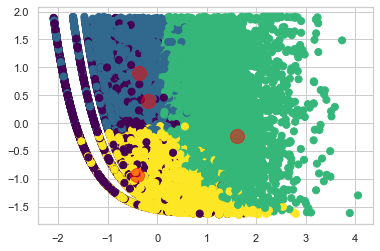

In [41]:
plt.scatter(clusters_5_features['log_daily_count'], clusters_5_features['age']
            , c=clusters_5_features['label'], s=50, cmap='viridis')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=0.5)

In [42]:
fig = px.scatter_3d(clusters_5_features, x="log_median_amount", y="log_count", z="age", color="label")
fig.update_layout(title="clusters")
fig.show()

In [44]:
fig = px.scatter_3d(clusters_5_features, x="log_median_amount", y="age", z="log_daily_count", color="label")
fig.update_layout(title="clusters")
fig.show()

In [45]:
# Cluster contribution to total transaction amount (revenue contribution)
merchant_total_amount = pd.DataFrame({'amount_usd':df_raw.groupby('merchant')['amount_usd_in_cents'].sum()/100})
merchant_total_amount = merchant_total_amount.merge(df_m['label'], left_index=True, right_index=True, how='left')
merchant_total_amount.groupby('label').sum().apply(lambda x: 100 * x / float(x.sum()))
pie = merchant_total_amount.groupby('label').sum().reset_index()
pie.columns = ['label','amount_usd']
px.pie(pie,values = 'amount_usd',names='label',color='label').show()

Text(0.5, 1.0, 'Account Age')

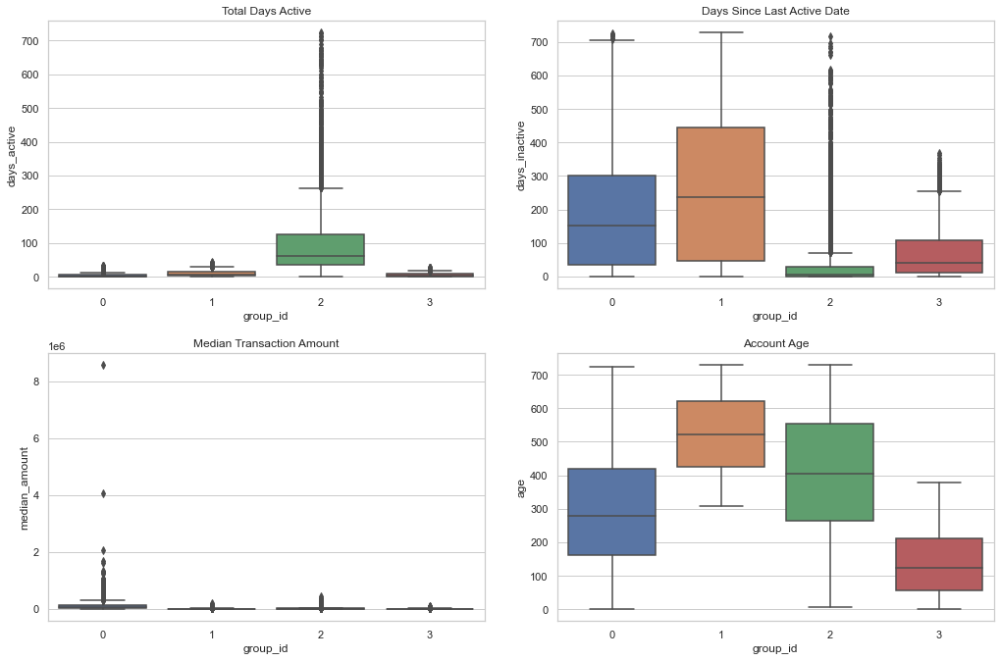

In [46]:
# Boxplots comparing attributions on different user groups
fig, ax = plt.subplots(2,2, figsize=(15,10))
fig.tight_layout(pad=3.0)

sns.boxplot(x="group_id", y="days_active", data=df_merchant, ax=ax[0,0])
ax[0,0].set_title("Total Days Active")
sns.boxplot(x="group_id", y="days_inactive", data=df_merchant, ax=ax[0,1])
ax[0,1].set_title("Days Since Last Active Date")
sns.boxplot(x="group_id", y="median_amount", data=df_merchant, ax=ax[1,0])
ax[1,0].set_title("Median Transaction Amount")
sns.boxplot(x="group_id", y="age", data=df_merchant, ax=ax[1,1])
ax[1,1].set_title("Account Age")

In [47]:
cluster_summary = df_merchant.groupby('group_id')[['avg_amount','median_amount','count','age'
                                                   ,'active_date_range','count_daily'
                                                   ,'days_active','days_inactive']].mean()
#cluster_summary.to_excel('cluster_summary.xlsx')

# Churn Prediction<a id='churn_prediction'></a>

## Define Churn<a id='define_churn'></a> 

Esimation of average resurrection rate given an observation period for churn. Estimation based on average lag (in days) between transactions for each user.

- Longer churn observation period --> less resurrection --> higher precision, at the cost of less actionable
- Shorter churn observation period --> more resurrction --> lower precision, with the benefit of more actionable

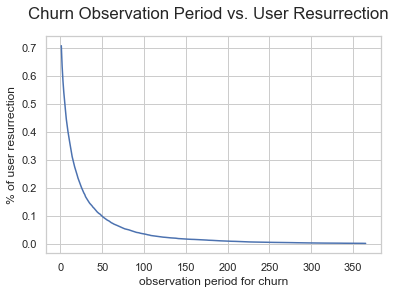

In [48]:
# Generate time lag between each transactions for each merchant
df_raw.sort_values(by=['merchant', 'dt'], inplace=True)
df_raw['dt_lagged'] = df_raw.groupby(['merchant'])['dt'].shift(1)
df_raw['lag'] = (df_raw['dt'] - df_raw['dt_lagged']).dt.days

# Calculate the average time lag for each merchant
merchant_mean_lag = pd.DataFrame(df_raw.groupby('merchant')['lag'].mean())

# Drop those with unknown lag, since there is no evidence of resurrection
merchant_mean_lag.dropna(inplace=True)

# Estimate the resurrection % given a fixed churn observation window
n_merchant = df_raw['merchant'].nunique()
resurrection = [len(merchant_mean_lag[merchant_mean_lag['lag']>i])/n_merchant for i in range(1,366)]
df_resurrect = pd.DataFrame({'churn_period': range(1,366), 'pct': resurrection})

plt.plot(df_resurrect['churn_period'],df_resurrect['pct'])
plt.xlabel('observation period for churn')
plt.ylabel('% of user resurrection')
plt.suptitle('Churn Observation Period vs. User Resurrection')
plt.show()

In [49]:
# Compare the likelihood of having user resurrection given a churn period of 30, 60, 90, 120 days
df_resurrect[df_resurrect['churn_period'].isin([30,60,90,120])]

,churn_period,pct
29,30,0.168560
59,60,0.077416
89,90,0.041809
119,120,0.024598


In [ ]:
#df_merchant.drop(['lag_x','lag_y','group_id','lag'],axis=1,inplace=True)
#df_merchant

In [50]:
# Users who started in the last quarter (Q8)
df_merchant[df_merchant['min_dt']>datetime.datetime(2034,12,31,23,59,59) - datetime.timedelta(90)]

,min_amount,avg_amount,median_amount,max_amount,count,min_dt,max_dt,active_date_range,age,count_daily,days_inactive,days_active,group_id
merchant,,,,,,,,,,,,,
0002d07bba,2057,22319.500000,21689.5,43842,4,2034-10-11 17:02:26,2034-12-15 09:56:19,64,81,0.049383,16,4,3
00607c6461,50094,50094.000000,50094.0,50094,1,2034-12-21 15:02:45,2034-12-21 15:02:45,1,10,0.100000,10,1,0
00858752bc,6775,6775.000000,6775.0,6775,1,2034-12-14 14:27:50,2034-12-14 14:27:50,1,17,0.058824,17,1,3
00ce0e442c,42583,49920.642857,46545.0,92619,14,2034-11-21 20:44:59,2034-12-29 18:16:33,37,40,0.350000,2,12,3
00d265586f,63638,63638.000000,63638.0,63638,1,2034-11-30 12:29:44,2034-11-30 12:29:44,1,31,0.032258,31,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
ff5b389b42,16081,24655.166667,23114.5,34547,6,2034-11-30 06:49:42,2034-12-30 04:05:17,29,31,0.193548,1,6,3
ff7a1e02da,1407,19270.181818,15474.0,48904,11,2034-10-03 14:25:57,2034-11-25 00:48:08,52,89,0.123596,36,8,3
ff9135ed50,18824,18824.000000,18824.0,18824,1,2034-11-30 18:46:36,2034-11-30 18:46:36,1,31,0.032258,31,1,3


Functions to create features and labels from raw data

In [69]:
def create_features(df_raw, end_dt, churn_period):
    
    # Truncate data so that all the features are based on dates prior to the churn observation period
    max_dt = end_dt - datetime.timedelta(churn_period)
    df_raw = df_raw[df_raw['dt'] <= max_dt]
    
    data = df_raw.groupby('merchant').agg(
                            #min_amount = ('amount_usd_in_cents', min),
                            avg_amount = ('amount_usd_in_cents', 'mean'),
                            #median_amount = ('amount_usd_in_cents', 'median'),
                            #max_amount = ('amount_usd_in_cents', max),
                            count = ('amount_usd_in_cents', 'count'),
                            #min_dt = ('dt', min),
                            max_dt = ('dt', max),
                            active_date_range = ('dt', lambda x: (max(x)-min(x)).days),
                            age = ('dt', lambda x: (dt_max - min(x)).days)
                        )
    # Set accounts with age = 0 to 1, to avoid division by 0
    data.loc[data['active_date_range']==0,'active_date_range'] = 1
    data.loc[data['age']==0,'age'] = 1
    
    # Get daily transaction count
    data['count_daily'] = data['count'] / data['age']
    
    # Days in active from the last active date to the analysis date
    data['days_inactive'] = [(max_dt - t).days for t in data['max_dt']]
    
    # Number of days with activity
    data['days_active'] = df_raw.groupby('merchant')['date'].nunique()
    data.drop(['max_dt'], axis=1, inplace=True)
    
    #merchant_mean_lag = pd.DataFrame(data=df_raw.groupby('merchant')['lag'].mean())
    #data = data.merge(merchant_mean_lag, left_index=True, right_index=True, how='left')
    
    return data

In [52]:
def create_label(df_raw, end_dt, churn_period):
    
    # Filter data only up to the end_dt
    df_raw = df_raw[df_raw['dt'] <= end_dt]
    
    # Cut-off date when the user is expected to be active if not churned
    max_dt = end_dt - datetime.timedelta(churn_period)
    
    # Date when the user was last active
    df_last_active = df_raw.groupby('merchant')['dt'].max()
    
    # If the user's last active date was before the cut-off date, then the user is churned
    label = (df_last_active < max_dt).astype(int).rename('isChurned')
    
    return pd.DataFrame(label)

In [70]:
# Generate data for training purpose Q1 - Q7, reserve Q8 for model testing
churn_period = 90
end_train = datetime.datetime(2034,12,31,23,59,59) - datetime.timedelta(churn_period)
print("Training data as of date: ", end_train)
features = create_features(df_raw, end_train, churn_period)
label = create_label(df_raw, end_train, churn_period)
data = features.merge(label, left_index=True, right_index=True, how='left' )

Training data as of date:  2034-10-02 23:59:59


In [ ]:
data

## Merchants who have already churned<a id='merchants_churned'></a> 

Total number of user:  14351
% of churned users:  0.41209671799874575
% of retained users:  0.5879032820012542


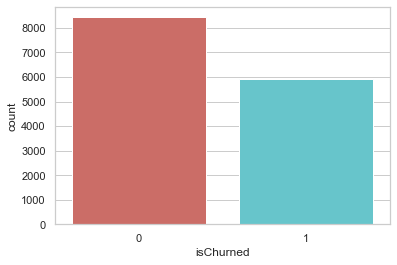

In [58]:
# Analysis date is 12/31/2034
end_dt = datetime.datetime(2034,12,31,23,59,59)
churn_period = 90
label = create_label(df_raw, end_dt, churn_period)
# % of users churned / not churned in the dataset
count_not_churned = len(label[label['isChurned']==0])
count_churned = len(label[label['isChurned']==1])
pct_of_churned = count_churned/(count_not_churned+count_churned)
print('Total number of user: ', len(label))
print('% of churned users: ', pct_of_churned)
print('% of retained users: ', 1 - pct_of_churned)
sns.countplot(x='isChurned', data=label, palette='hls')
plt.show()

In [59]:
# Group by churn label and cluster label
df_merchant = df_merchant.merge(label, left_index=True, right_index=True, how='left')
df_merchant.groupby(['isChurned','group_id'])['group_id'].count()/len(df_merchant)

isChurned  group_id
0          0           0.070796
           1           0.084106
           2           0.229810
           3           0.203191
1          0           0.109261
           1           0.170999
           2           0.042506
           3           0.089332
Name: group_id, dtype: float64

## Building Classification Model<a id='build_model'></a>

### Feature exploration using Mutual Information<a id='feature_expl'></a>

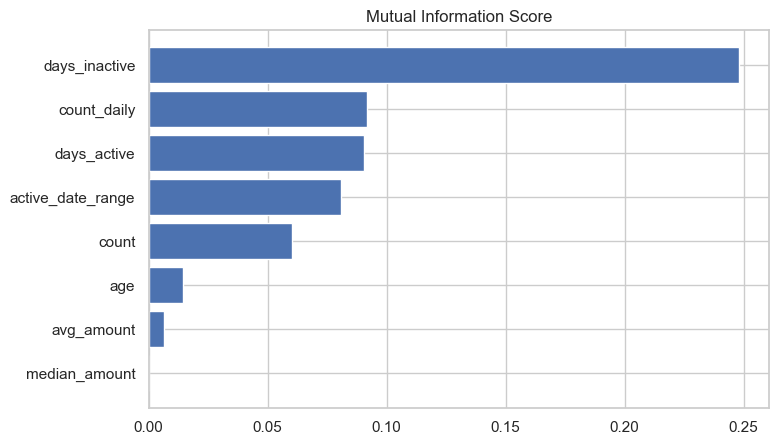

In [68]:
# Using Q1 - Q7 data for feature exploration
X = data.copy()
#X.drop(['max_dt','lag'], axis=1, inplace=True)
y = X.pop("isChurned")

def make_mi_scores(X, y):
    mi_scores = mutual_info_classif(X, y)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, y)
#mi_scores 

def plot_feature_scores(scores, plot_title):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title(plot_title)

plt.figure(dpi=100, figsize=(8, 5))
plot_feature_scores(mi_scores, 'Mutual Information Score')

### Model Training Using Cross Validation<a id='cv'></a> 

In [60]:
def nested_cross_validation(df_raw, end_date, model, churn_period=90):
    
    # Split training and testing sets by time
    start_date = datetime.datetime(2033,1,1)
    
    #time_inc = (end_date - start_date)/n_fold
    time_inc = churn_period
    n_fold = ((end_date - start_date)/churn_period).days - 2
    print('n_fold: ', n_fold)
    
    f1 = []
    roc_auc = []
    accuracy = []

    for i in range(n_fold):
        
        # Training set
        start_train = start_date
        end_train = start_date + datetime.timedelta(time_inc * (i+2))

        features = create_features(df_raw, end_train, churn_period)
        label = create_label(df_raw, end_train, churn_period)
        data = features.merge(label, left_index=True, right_index=True, how='left' )
        X_train = data.copy()
        y_train = X_train.pop("isChurned")
        #print('Training set end date: ', end_train)

        # Validation set
        start_test = start_date
        end_test = start_date + datetime.timedelta(time_inc * (i+3))

        features = create_features(df_raw, end_test, churn_period)
        label = create_label(df_raw, end_test, churn_period)
        data = features.merge(label, left_index=True, right_index=True, how='left' )
        X_test = data.copy()
        y_test = X_test.pop("isChurned")
        
        # Fit model
        #model = LogisticRegression(random_state=0, max_iter=400, solver='liblinear', penalty=penalty)
        model.fit(X_train, y_train)
        # make prediction on test set using defualt threshold (0.5)
        y_pred = model.predict(X_test)
        # predict probabilities
        lr_probs = model.predict_proba(X_test)
        lr_probs = lr_probs[:, 1]
        
        # record performance
        f1.append(f1_score(y_test, y_pred))
        roc_auc.append(roc_auc_score(y_test, lr_probs)) 
        accuracy.append(accuracy_score(y_test, y_pred))
        
        #print('Validation set end date: ', end_test)
        
    print('Features used: ', features.columns)    
    print('F1 Score: %.3f (%.3f)' % (np.mean(f1), np.std(f1)))
    print('ROC AUC: %.3f (%.3f)' % (np.mean(roc_auc), np.std(roc_auc)))
    print('Accuracy: %.3f (%.3f)' % (np.mean(accuracy), np.std(accuracy)))
    return np.mean(f1)

In [72]:
# Logistic Regression with 7 features
model = LogisticRegression(random_state=0, max_iter=400, solver='liblinear', penalty='l2')
f1_lr_l2 = nested_cross_validation(df_raw, end_train, model, churn_period=90)

n_fold:  5
Features used:  Index(['avg_amount', 'count', 'active_date_range', 'age', 'count_daily',
       'days_inactive', 'days_active'],
      dtype='object')
F1 Score: 0.743 (0.035)
ROC AUC: 0.851 (0.020)
Accuracy: 0.783 (0.017)


In [73]:
# Random Forest with 7 features
model_rf = RandomForestClassifier()
f1_rf = nested_cross_validation(df_raw, end_train, model_rf, churn_period=90)

n_fold:  5
Features used:  Index(['avg_amount', 'count', 'active_date_range', 'age', 'count_daily',
       'days_inactive', 'days_active'],
      dtype='object')
F1 Score: 0.734 (0.058)
ROC AUC: 0.859 (0.021)
Accuracy: 0.777 (0.026)


Hyperparameter tuning for Logistic Regression

In [87]:
best_penalty = ''
max_f1_lr = 0

for penalty in ['l1','l2']:
    model_lr = LogisticRegression(random_state=0, max_iter=400, solver='liblinear', penalty=penalty)
    f1 = nested_cross_validation(df_raw, end_train, model_lr, churn_period=90)
    if f1 > max_f1_lr:
        max_f1_lr = f1
        best_penalty = penalty

print(f'Best penalty for Logistic: {best_penalty}')
print(f'Best F1 score for Logistic: {max_f1_lr}')

n_fold:  5
Features used:  Index(['avg_amount', 'count', 'active_date_range', 'age', 'count_daily',
       'days_inactive', 'days_active'],
      dtype='object')
F1 Score: 0.736 (0.032)
ROC AUC: 0.851 (0.019)
Accuracy: 0.779 (0.016)
n_fold:  5
Features used:  Index(['avg_amount', 'count', 'active_date_range', 'age', 'count_daily',
       'days_inactive', 'days_active'],
      dtype='object')
F1 Score: 0.743 (0.035)
ROC AUC: 0.851 (0.020)
Accuracy: 0.783 (0.017)
Best penalty for Logistic: l2
Best F1 score for Logistic: 0.7429748036907105


Hyerperparameter tuning for Random Forest

In [88]:
# Hyperparameter Grid for RF
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1100, num = 3)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 2)]
max_depth.append(None)
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth}
print(random_grid)

# Hyperparameter search for random forest classifier - using F1 score as criteria
max_f1 = 0
best_n_est = 200
best_max_f = 'auto'
best_max_d = 10

for n_est in n_estimators:
    for max_f in max_features:
        for max_d in max_depth:
            model_rf = RandomForestClassifier(n_estimators=n_est, max_features=max_f, max_depth=max_d)
            f1 = nested_cross_validation(df_raw, end_train, model_rf, churn_period=90)
            if f1 > max_f1:
                max_f1 = f1
                best_n_est = n_est
                best_max_f = max_f
                best_max_d = max_d

{'n_estimators': [100, 600, 1100], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 110, None]}
n_fold:  5
Features used:  Index(['avg_amount', 'count', 'active_date_range', 'age', 'count_daily',
       'days_inactive', 'days_active'],
      dtype='object')
F1 Score: 0.745 (0.049)
ROC AUC: 0.865 (0.021)
Accuracy: 0.785 (0.022)
n_fold:  5
Features used:  Index(['avg_amount', 'count', 'active_date_range', 'age', 'count_daily',
       'days_inactive', 'days_active'],
      dtype='object')
F1 Score: 0.730 (0.056)
ROC AUC: 0.859 (0.020)
Accuracy: 0.776 (0.023)
n_fold:  5
Features used:  Index(['avg_amount', 'count', 'active_date_range', 'age', 'count_daily',
       'days_inactive', 'days_active'],
      dtype='object')
F1 Score: 0.732 (0.061)
ROC AUC: 0.860 (0.020)
Accuracy: 0.778 (0.025)
n_fold:  5
Features used:  Index(['avg_amount', 'count', 'active_date_range', 'age', 'count_daily',
       'days_inactive', 'days_active'],
      dtype='object')
F1 Score: 0.738 (0.063)
ROC AUC: 0.865 (

In [89]:
print(f'Best parameters for RF: n_estimator: {best_n_est}, max_features: {best_max_f}, max_depth: {best_max_d}')
print(f'Best F1 score for RF: {max_f1}')

Best parameters for RF: n_estimator: 100, max_features: auto, max_depth: 10
Best F1 score for RF: 0.7445590105883764


In [91]:
model_rf = RandomForestClassifier(n_estimators=best_n_est, max_features=best_max_f, max_depth=best_max_d)
f1_rf = nested_cross_validation(df_raw, end_train, model_rf, churn_period=90)

n_fold:  5
Features used:  Index(['avg_amount', 'count', 'active_date_range', 'age', 'count_daily',
       'days_inactive', 'days_active'],
      dtype='object')
F1 Score: 0.746 (0.049)
ROC AUC: 0.866 (0.019)
Accuracy: 0.784 (0.021)


### Model Evaluation<a id='model_evaluation'></a> 

Fit the chosen model once again on the full training dataset (Q1 - Q7), and evaluate on the test data (Q8)

In [92]:
# Split training and testing sets by time
churn_period = 90

# Training set
end_train = datetime.datetime(2034,10,2,23,59,59)
features_train = create_features(df_raw, end_train, churn_period)
label_train = create_label(df_raw, end_train, churn_period)
data_train = features_train.merge(label_train, left_index=True, right_index=True, how='left' )
X_train = data_train.copy()
y_train = X_train.pop("isChurned")

# Testing set
end_test = datetime.datetime(2034,12,31,23,59,59)
features_test = create_features(df_raw, end_test, churn_period)
label_test = create_label(df_raw, end_test, churn_period)
data_test = features_test.merge(label_test, left_index=True, right_index=True, how='left' )
X_test = data_test.copy()
y_test = X_test.pop("isChurned")

In [93]:
print(f'Training set end date: {end_train}, Test set end date: {end_test}, Test set total users: {len(label_test)}')

Training set end date: 2034-10-02 23:59:59, Test set end date: 2034-12-31 23:59:59, Test set total users: 14351


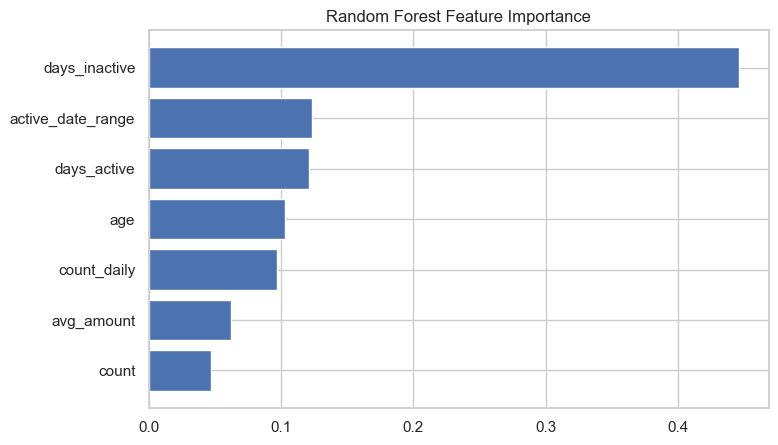

In [94]:
model_rf = RandomForestClassifier(n_estimators=best_n_est, max_features=best_max_f, max_depth=best_max_d)
model_rf.fit(X_train, y_train)

# Get feature importance 
importance = model_rf.feature_importances_
# Summarize and plot
feature_importance = pd.Series(importance, name="RF Feature Importance", index=X_train.columns)
feature_importance = feature_importance.sort_values(ascending=False)
plt.figure(dpi=100, figsize=(8, 5))
plot_feature_scores(feature_importance, 'Random Forest Feature Importance')

In [95]:
def evaluate_dataset(X_train, X_test, y_train, y_test, model):
    
    # fit a model
    model.fit(X_train, y_train)
    
    # make prediction on test set using defualt threshold (0.5)
    y_pred = model.predict(X_test)
    # predict probabilities
    lr_probs = model.predict_proba(X_test)
    # keep probabilities for the positive outcome only
    lr_probs = lr_probs[:, 1]
    
    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    ConfusionMatrixDisplay(cm).plot()
    plt.show()
    
    print(classification_report(y_test, y_pred))
    
    # The following sections of this function is referenced from 
    # https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/
    
    # Precision-Recall Curve
    
    lr_precision, lr_recall, _ = precision_recall_curve(y_test, lr_probs)
    lr_f1, lr_auc = f1_score(y_test, y_pred), auc(lr_recall, lr_precision)
    # summarize scores
    print('Model: F1 = %.3f AUC (precision-recall) = %.3f' % (lr_f1, lr_auc))
    # plot the precision-recall curves
    no_skill = len(y_test[y_test==1]) / len(y_test)
    plt.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
    plt.plot(lr_recall, lr_precision, marker='.', label='Model')
    # axis labels
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    # show the legend
    plt.legend()
    # show the plot
    plt.show()

    # ROC curve
    
    # generate a no skill prediction (majority class)
    ns_probs = [0 for _ in range(len(y_test))]

    # calculate scores
    ns_auc = roc_auc_score(y_test, ns_probs)
    lr_auc = roc_auc_score(y_test, lr_probs)
    # summarize scores
    print('No Skill: ROC AUC = %.3f' % (ns_auc))
    print('Model: ROC AUC = %.3f' % (lr_auc))
    # calculate roc curves
    ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
    lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)
    # plot the roc curve for the model
    plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
    plt.plot(lr_fpr, lr_tpr, marker='.', label='Model')
    # axis labels
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    # show the legend
    plt.legend()
    # show the plot
    plt.show()

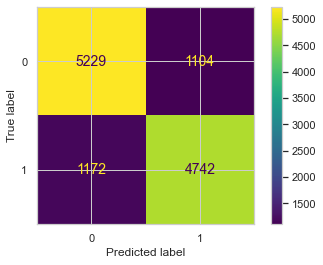

              precision    recall  f1-score   support

           0       0.82      0.83      0.82      6333
           1       0.81      0.80      0.81      5914

    accuracy                           0.81     12247
   macro avg       0.81      0.81      0.81     12247
weighted avg       0.81      0.81      0.81     12247

Model: F1 = 0.806 AUC (precision-recall) = 0.856


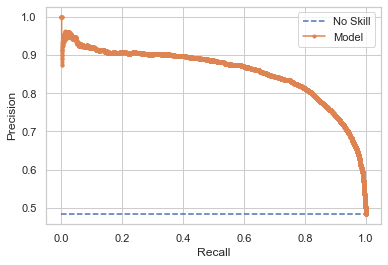

No Skill: ROC AUC = 0.500
Model: ROC AUC = 0.888


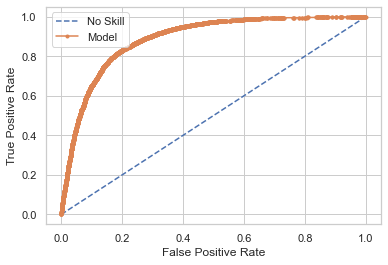

In [96]:
model_rf = RandomForestClassifier(n_estimators=best_n_est, max_features=best_max_f, max_depth=best_max_d)
evaluate_dataset(X_train, X_test, y_train, y_test, model_rf)

# References 

[1] https://towardsdatascience.com/clustering-with-more-than-two-features-try-this-to-explain-your-findings-b053007d680a

[2] https://towardsdatascience.com/time-series-nested-cross-validation-76adba623eb9